In [1]:
import os
os.environ["CC"] = "gcc"
os.environ["CXX"] = "gcc"

In [2]:
import sys
sys.path.append('/usr/lib/python3/dist-packages')
print(sys.path)


['/home/beast2020/Desktop/mingchi/PixTransform-save_params', '/home/beast2020/anaconda3/lib/python38.zip', '/home/beast2020/anaconda3/lib/python3.8', '/home/beast2020/anaconda3/lib/python3.8/lib-dynload', '', '/home/beast2020/.local/lib/python3.8/site-packages', '/home/beast2020/anaconda3/lib/python3.8/site-packages', '/home/beast2020/.local/lib/python3.8/site-packages/IPython/extensions', '/home/beast2020/.ipython', '/usr/lib/python3/dist-packages']


In [3]:
import os
os.environ["OMP_PROC_BIND"] = os.environ.get("OMP_PROC_BIND", "true")

import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
%matplotlib inline

from pix_transform.pix_transform import PixTransform
from baselines.baselines import bicubic
from utils.utils import downsample,align_images
from prox_tv import tvgen
from utils.plots import plot_result

## EPFL nadir

In [4]:
# %env CUDA_VISIBLE_DEVICES=1

In [5]:
import imageio
import torch
torch.cuda.empty_cache()

In [6]:
directory = os.path.dirname(os.getcwd())
directory

'/home/beast2020/Desktop/mingchi'

In [7]:
rgb_dir = directory+'/EPFL_10_newsample_nadir/rgb/'
_files = os.listdir(rgb_dir)
_files.sort()
_rgb_files = [rgb_dir + f for f in _files]
_rgb_files.sort()
print(len(_rgb_files))

dist_dir = directory+'/EPFL_10_newsample_nadir/dist/'
_files = os.listdir(dist_dir)
_files.sort()
_dist_files = [dist_dir + f for f in _files]
_dist_files.sort()
print(len(_dist_files))

25
25


In [8]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [9]:
print(guide_imgs.shape)
print('max value in the image is: ' + str(guide_imgs.max()))
print('min value in the image is: ' + str(guide_imgs.min()))

(25, 3, 480, 720)
max value in the image is: 255
min value in the image is: 0


In [10]:
print(target_imgs.shape)
print('max value in the image is: ' + str(target_imgs.max()))
print('min value in the image is: ' + str(target_imgs.min()))

(25, 480, 720)
max value in the image is: 97.91275
min value in the image is: 44.26991


In [11]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 8,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*60*90//32, # could //4 or //16 for debugging, so to save time
                  
          'logstep': 16,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }



####### image 1/10 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[21.565214   6.527124   4.4189715  4.2116823  4.579486   3.480629
  3.5229275  3.3831048  3.250335   3.1766496  2.9082437  2.8734086
  3.0965455  2.9018254  2.7913964  2.6074605  2.6906476  2.8328989
  2.5768092  2.825833   2.59131    2.588496   2.5189166  2.4466856
  2.63745    2.509591   2.4594004  2.490903   2.4063683  2.2557395
  2.4839404  2.4350703  2.516784   2.3576193  2.1690288  2.2277162
  2.2826571  2.197675   2.27702    2.1491332  2.0273278  2.1440115
  2.2016964  2.123645   2.1544933  2.138652   2.0454772  2.4425917
  2.0529091  2.0801518  1.9802188  2.1253006  2.1280634  1.9946961
  2.0968213  1.8992661  2.0181308  1.9124297  1.9337159  1.9647675
  1.9803267  1.9062319  2.0305576  2.068839 ]
----------MAE----------
(64,)
[3.599322   1.7201837  1.2813561  1.2631814  1.3568702  1.1084002
 1.0695273  1.1241947  1.1426291  1.0752937  0.9742773  0.914257
 1.0986023  0.96796286 0.95882124 0.8904816  0.91287035 0.95304286
 0.89223725 0.9905155  0.91

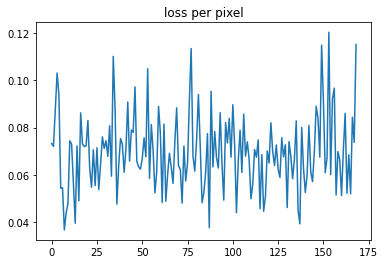

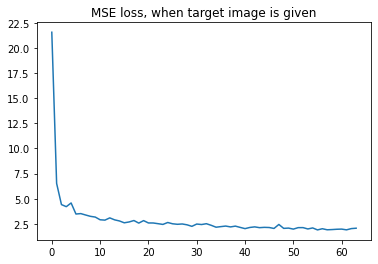

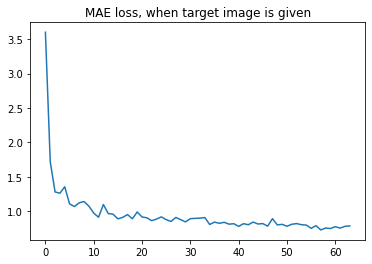

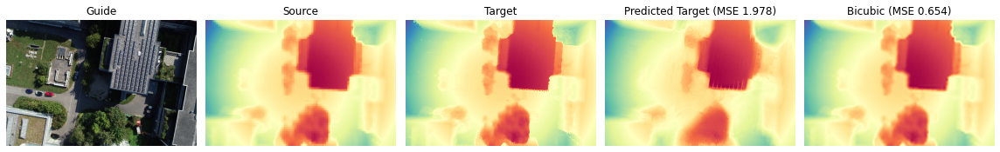

MSE: 1.978  ---  MAE: 0.793  ---  PBP: 0.238



####### image 2/10 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[16.127705   6.8147388  5.0442214  4.080684   3.675792   3.4163501
  3.1036906  2.9262295  3.003621   2.7795238  2.7268445  2.7643423
  2.6349285  2.5038755  2.4104488  2.423479   2.3005526  2.176682
  2.2812407  2.1681876  2.2889738  2.266253   2.0913966  2.200553
  2.017356   1.9318539  1.9506816  1.9620891  1.8274287  1.8719202
  1.8715223  1.8537236  1.8642392  1.9330999  1.817451   1.868873
  2.0013607  1.8710374  1.687513   1.7068508  1.8942531  1.7701197
  1.7112275  1.6338223  1.7679192  1.6242046  1.5917969  1.6131091
  1.6019682  1.5866936  1.6452892  1.4886086  1.6652406  1.526386
  1.4883778  1.5165533  1.474107   1.4356097  1.488909   1.4788313
  1.4845736  1.5178559  1.5625739  1.405727 ]
----------MAE----------
(64,)
[2.9380994  1.6272045  1.3284     1.178756   1.0998057  1.0486561
 0.94426864 0.9326518  0.9630849  0.9169847  0.89492786 0.88757616
 0.87353903 0.84205693 0.8245986  0.819448   0.7985513  0.81939894
 0.77753353 0.7376806  0.789

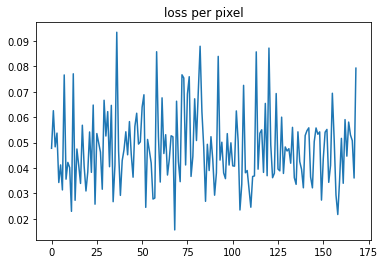

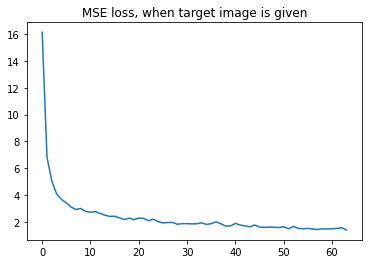

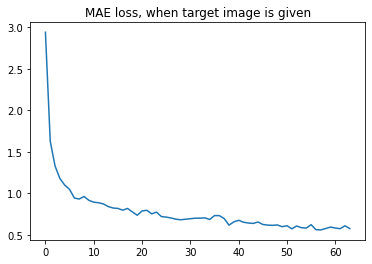

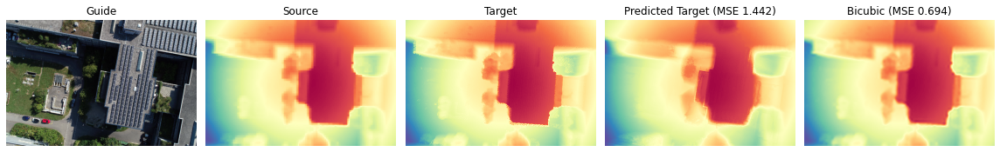

MSE: 1.442  ---  MAE: 0.575  ---  PBP: 0.143



####### image 3/10 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[19.073418  13.973705  13.157495  10.375082   7.804867   6.4565735
  5.2208767  7.01172    4.9107723  4.0503163  4.9514585  3.7317953
  3.5328834  3.7636678  3.705646   3.8563433  3.027704   3.132292
  3.1144521  2.8387403  2.976107   2.9408047  2.6070664  2.826444
  3.0336254  2.941945   2.7053504  2.787428   2.5607555  2.5099738
  2.706768   2.5648868  2.504361   2.9609394  2.586808   2.4468904
  2.7082832  2.3816955  2.348293   2.7089348  2.3376658  2.7009375
  2.3545651  2.3076797  2.686153   2.3633425  2.4115822  2.20003
  2.1373153  2.2193816  2.2899706  2.3236942  2.3863328  2.2336075
  2.2049158  2.1643288  2.2341177  2.3424892  2.3474867  2.4015045
  2.0935175  2.2112598  2.1648998  2.4316614]
----------MAE----------
(64,)
[3.245209   2.4600148  2.3225858  2.042498   1.8859321  1.7210766
 1.567292   1.7277626  1.5424994  1.342191   1.5168681  1.3016059
 1.279487   1.3077148  1.2840004  1.3297964  1.1814622  1.1729027
 1.1819748  1.121965   1.15012

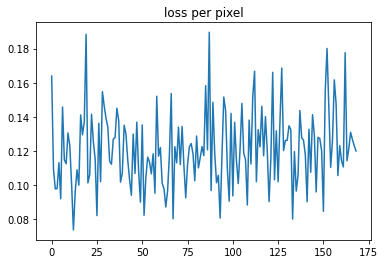

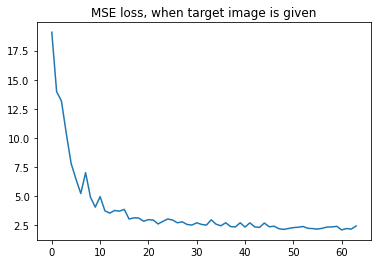

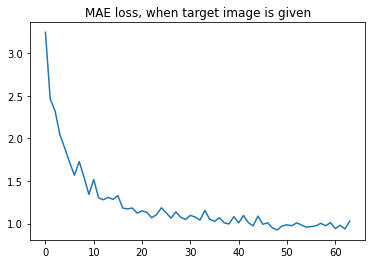

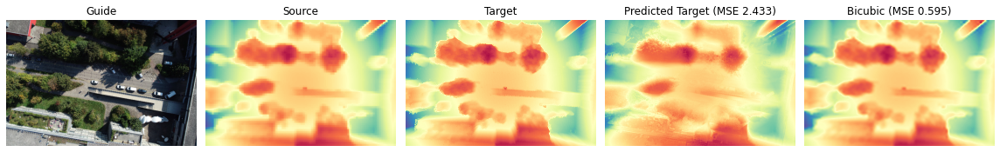

MSE: 2.433  ---  MAE: 1.032  ---  PBP: 0.347



####### image 4/10 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[21.030788   5.381885   3.899873   3.5768735  2.9145536  2.719709
  2.3108408  2.3407264  2.3554869  2.027258   2.034033   2.0162556
  2.0951903  2.1993008  2.0881782  2.2335691  1.7475879  1.736562
  1.7005507  1.7298118  1.6719153  1.7159677  2.025808   1.6471406
  1.6207867  1.9178416  1.5599761  1.6716669  1.5882534  1.6981915
  1.5661361  1.5349929  1.5677642  1.5565234  1.5423994  1.494568
  1.4813752  1.6564337  1.4151306  1.4389844  1.6972135  1.4229065
  1.4467858  1.4821972  1.5476172  1.4879835  1.4030586  1.4418489
  1.5745398  1.4567116  1.458883   1.5154078  1.4248644  1.371062
  1.4494133  1.3909872  1.5233463  1.3706958  1.3886849  1.4798305
  1.405246   1.4637389  1.3722936  1.3444946]
----------MAE----------
(64,)
[3.5274892  1.5496101  1.3354626  1.219727   1.086045   1.0196034
 0.91014296 0.8710894  0.9433351  0.81915003 0.8101385  0.82211995
 0.86899287 0.8921488  0.8442453  0.8996404  0.7474809  0.75621367
 0.7403558  0.763868   0.755

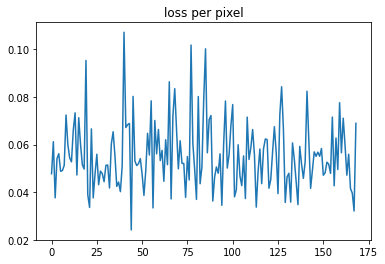

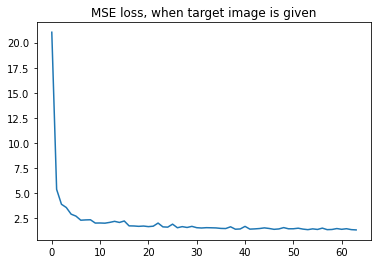

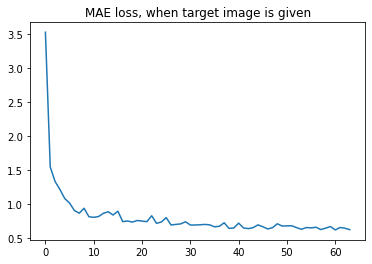

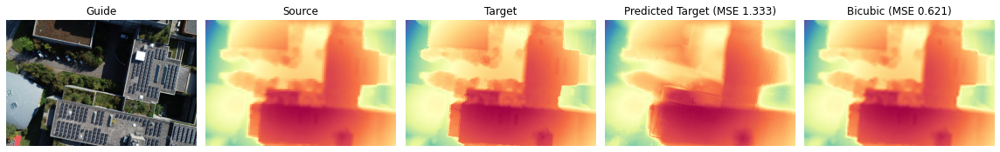

MSE: 1.333  ---  MAE: 0.602  ---  PBP: 0.161



####### image 5/10 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[18.265873   7.2908278  4.599139   4.1081634  3.3754716  2.9219737
  3.617689   2.7730365  2.7669404  2.2768114  2.513968   2.3872492
  2.2106724  2.1653783  2.4901643  2.0006204  1.9885026  1.9331205
  1.806997   1.8392384  1.8793801  1.787077   1.6682377  2.0938725
  1.6417611  1.7681662  1.7828505  1.6737522  1.659943   1.60216
  2.0416486  1.5463461  1.6271101  1.5912827  1.5076967  1.5665458
  1.5800076  1.6799436  1.6183442  1.5310745  1.6446443  1.5765175
  1.5824677  1.4464817  1.6273162  1.5126003  1.4598752  1.5091536
  1.4735293  1.5061579  1.6826566  1.3936013  1.4297985  1.4461943
  1.6669003  1.3932452  1.378544   1.6376162  1.3845943  1.4304905
  1.4713117  1.4073242  1.3685731  1.4158807]
----------MAE----------
(64,)
[3.211183   1.8992206  1.3915881  1.3344594  1.2215359  1.0655305
 1.2278994  1.025626   1.0453808  0.9176152  0.99852383 0.98519206
 0.9385605  0.9093222  0.97757494 0.8283856  0.87545764 0.83681506
 0.7921327  0.792468   0.7

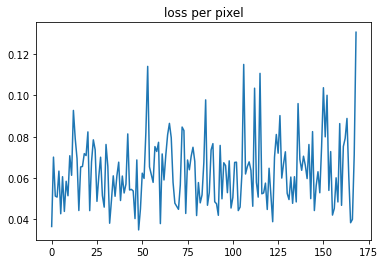

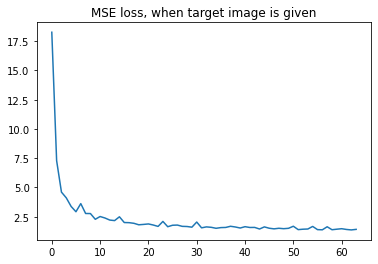

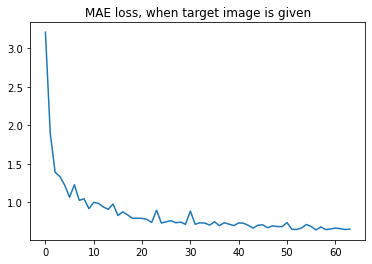

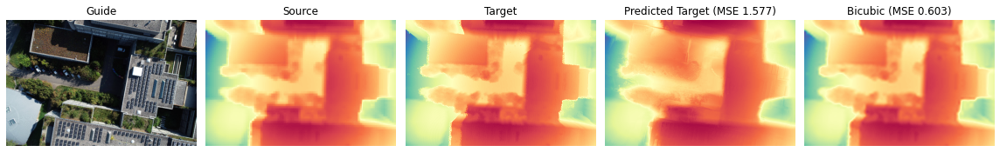

MSE: 1.577  ---  MAE: 0.704  ---  PBP: 0.197



####### image 6/10 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[17.937551   6.921771   4.9593506  4.2109575  3.8519206  3.514537
  3.4763904  3.4870949  3.3547258  2.8998594  2.9082086  2.9309769
  2.7737503  3.023105   2.7209947  3.0231047  2.837717   2.644033
  2.498701   2.6861987  2.6777775  2.6805172  2.5984364  2.5575078
  2.3294568  2.4862437  2.454626   2.4427059  2.3969574  2.3856702
  2.556686   2.7336216  2.348285   2.4091678  2.3199482  2.5011024
  2.4276845  2.3552098  2.2709672  2.3022075  2.273916   2.4002404
  2.288463   2.2127697  2.380421   2.469464   2.2600758  2.3310428
  2.1218703  2.4697344  2.245354   2.2235117  2.2958865  2.319172
  2.1384485  2.2420092  2.1866195  2.1312244  2.1841342  2.2111928
  2.3671055  2.1181893  2.1082108  2.4165277]
----------MAE----------
(64,)
[3.2357936  1.8470479  1.4487816  1.2941705  1.2533195  1.1473439
 1.1331103  1.1698438  1.0957328  1.0415348  1.0191783  1.0218972
 0.9715742  1.0677909  0.9724427  1.091058   1.0361568  0.9325049
 0.8950536  0.9289948  0.9450

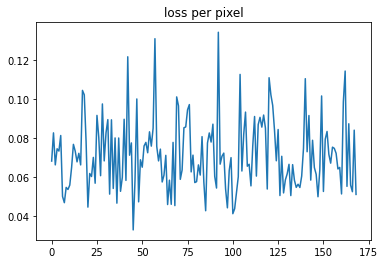

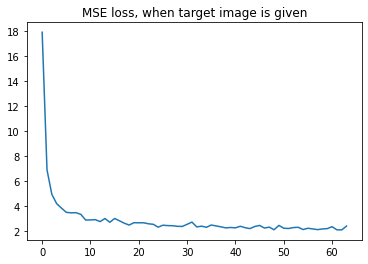

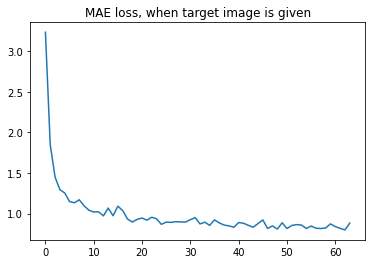

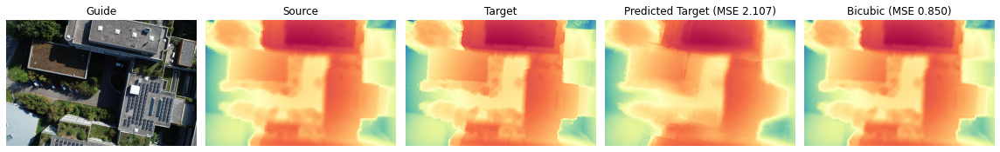

MSE: 2.107  ---  MAE: 0.792  ---  PBP: 0.226



####### image 7/10 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[19.17646    6.4716744  6.0286055  5.632173   5.9648924  4.987884
  4.824524   4.6762486  4.0630317  4.111986   3.7405639  3.5960038
  3.4696875  3.1132903  3.3405406  2.9885094  2.7214134  2.7272758
  2.6453779  3.0844111  2.6667397  2.5575373  2.4479177  2.5050004
  2.3171802  2.715575   2.2686458  2.2279632  2.313295   2.3412702
  2.2151725  2.2716696  2.2598162  2.2302358  2.1304696  2.1729977
  2.2406383  2.1495776  2.2240398  2.1364515  2.216412   2.1854818
  2.116662   2.097258   2.0933392  2.1098099  2.2943523  2.0619369
  2.063227   2.0327616  1.9231764  1.9795939  2.1370447  2.0011356
  2.1176918  2.0221317  1.939754   2.193094   2.1418812  2.0623865
  1.9964606  2.0330148  2.022701   1.9530994]
----------MAE----------
(64,)
[3.1140473  1.6539026  1.4102646  1.3824925  1.4481232  1.2303034
 1.2049506  1.2079451  1.1294847  1.0922099  1.0567474  1.1308377
 1.0337398  0.96070856 1.0080068  0.9965833  0.9017369  0.9142262
 0.90938646 0.9593458  0.93

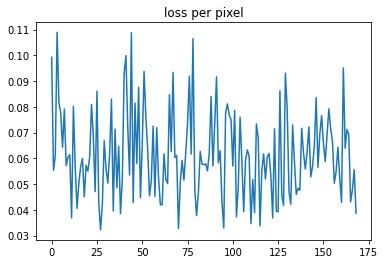

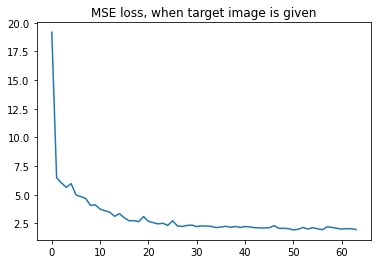

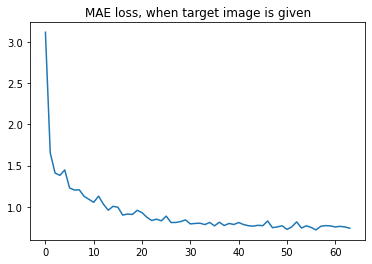

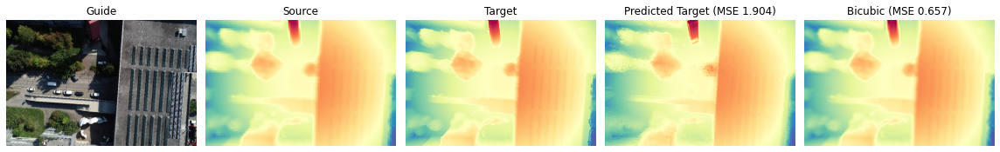

MSE: 1.904  ---  MAE: 0.721  ---  PBP: 0.206



####### image 8/10 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[16.43742    8.484334   6.579849   5.784575   5.247663   4.8144693
  4.774783   4.26837    4.1052055  4.0056343  4.060806   3.7638886
  3.6457088  3.6595645  3.8217912  3.536396   3.6551425  3.5017896
  3.3562167  3.4182298  3.6034296  3.321624   3.375307   3.2729897
  3.3326707  3.319827   3.208483   3.1828291  3.1338103  3.2775354
  3.4472194  3.5249813  3.1478827  3.1980855  3.0794427  3.0104682
  3.0134227  3.230004   3.071973   2.9550893  2.973057   3.026093
  2.8958297  2.8885202  2.9064832  2.851846   2.8682034  2.9052498
  2.8201828  2.813336   2.7589488  2.7479825  2.7953627  2.7788658
  2.6650329  2.6324542  2.6574492  2.835311   2.6452937  2.6934848
  2.7766855  2.7434583  2.793406   2.5821238]
----------MAE----------
(64,)
[2.7621279  1.7969003  1.4964238  1.3883402  1.3225552  1.2801994
 1.2454239  1.1443329  1.1392263  1.0965477  1.0871089  1.0455854
 0.99137425 1.0300546  1.0158844  0.9660743  0.9996095  0.96620643
 0.919615   0.9289879  0.9

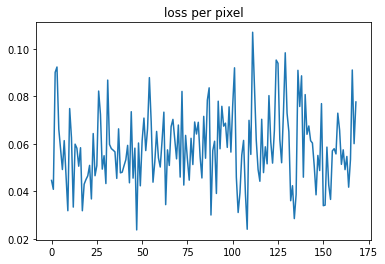

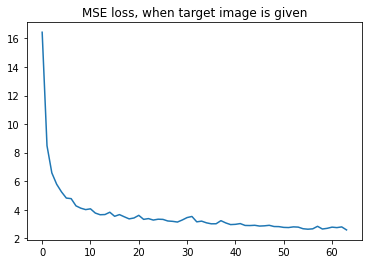

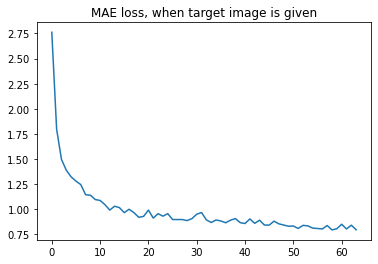

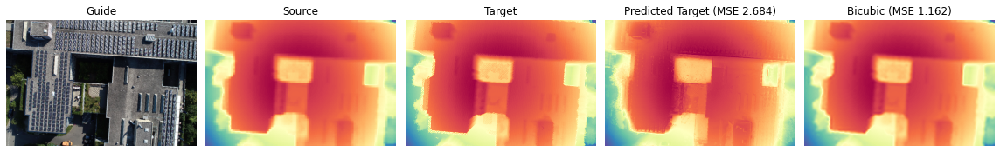

MSE: 2.684  ---  MAE: 0.839  ---  PBP: 0.223



####### image 9/10 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[28.629086   7.3279896  5.580108   4.0072427  4.0037656  3.92295
  3.4358785  3.2877598  3.387175   3.3049297  3.385549   3.37629
  3.1469243  3.204166   3.5793743  3.0193868  3.417976   3.45319
  3.0563593  3.2117708  2.962927   2.953311   3.1805453  3.0950437
  2.9829817  2.96573    3.0906973  2.9600139  3.1479197  3.0684721
  3.1057549  2.8869092  2.9159775  2.9074914  2.967111   2.9491875
  2.9783409  2.8699737  2.845315   2.8176577  2.848483   2.8304718
  2.8858445  2.8063083  2.7289085  2.7967045  2.9400582  2.781303
  2.7992086  2.7592087  2.8217235  2.811629   2.819      2.781763
  2.7642527  2.8716073  2.7549381  2.8879302  2.8174407  2.6822155
  2.7424948  2.8251283  2.8772538  2.8145685]
----------MAE----------
(64,)
[3.7705505  1.7957302  1.4606341  1.1927986  1.2132777  1.1551111
 1.0170014  0.9897155  0.9981306  1.0223511  1.0071251  1.0002701
 0.9554117  0.9669025  1.0980046  0.9261471  1.0015681  1.0227001
 0.95089245 0.9859525  0.9246441  

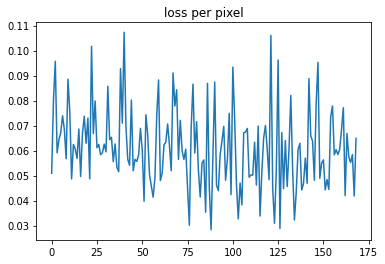

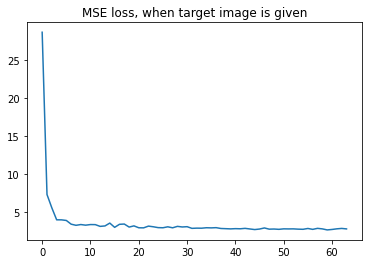

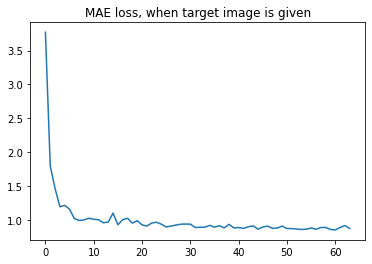

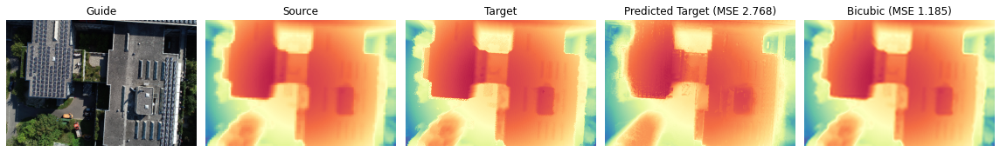

MSE: 2.768  ---  MAE: 0.861  ---  PBP: 0.233



####### image 10/10 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(64,)
[28.623108   6.8541126  5.495642   4.843258   4.9052935  4.3739676
  4.293359   4.261292   4.3705225  3.8671556  4.122616   3.888031
  3.9785793  3.7818375  3.5617712  3.693856   3.6650903  3.547061
  3.4854097  3.6311893  3.6455717  3.366224   3.8069758  3.8691847
  3.5080013  3.273963   3.5009778  3.3365414  3.3244736  3.2083347
  3.3081448  3.170183   3.1866927  3.248491   3.1408231  3.1300635
  3.1103241  3.3143811  3.046033   3.2358127  3.0554876  3.013882
  3.0862312  3.1665716  2.9780586  3.1540031  3.3155613  3.0197031
  3.0566912  3.0367367  3.1187913  3.0706642  3.0917823  2.9531796
  2.9045856  2.9391015  2.8430254  2.9535306  2.8318613  2.898697
  2.838532   3.0255628  2.8372104  2.9872222]
----------MAE----------
(64,)
[3.681123   1.6374512  1.439918   1.337799   1.2946771  1.1825176
 1.1578429  1.1602819  1.1693677  1.0832568  1.11992    1.0854853
 1.1108977  1.0663409  1.0221969  1.0475662  1.0252372  1.0035777
 0.9887707  1.0326376  1.00092

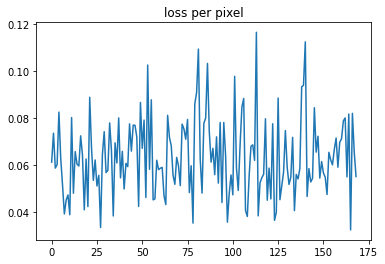

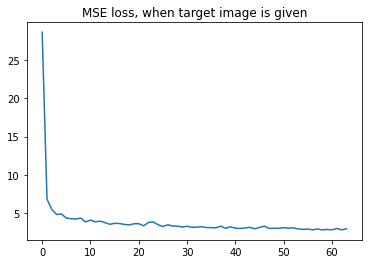

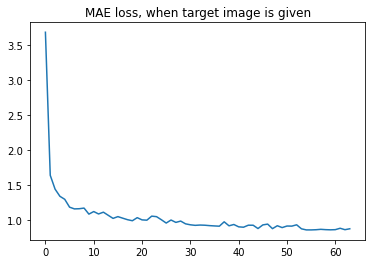

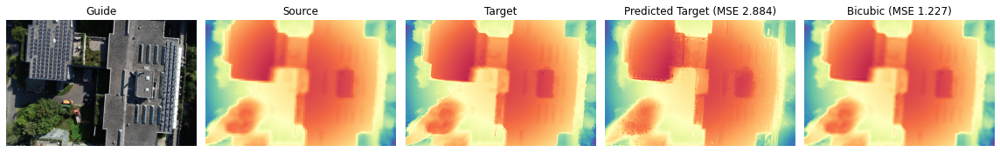

MSE: 2.884  ---  MAE: 0.868  ---  PBP: 0.239





In [26]:
if len(params['img_idxs'])==0:
    idxs = np.array(range(0,target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = guide_imgs[idx]
    target_img = target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_EPFL_nadir/model'+str(idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 



### Check if target_img is not given

  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(0,)
[]
----------MAE----------
(0,)
[]


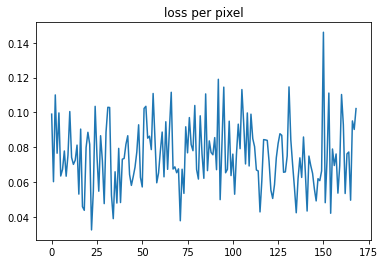

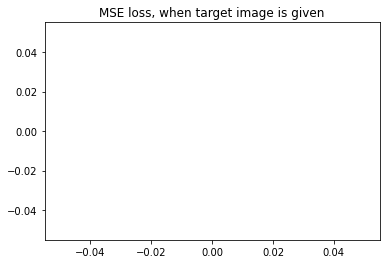

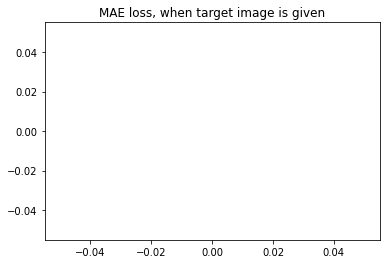

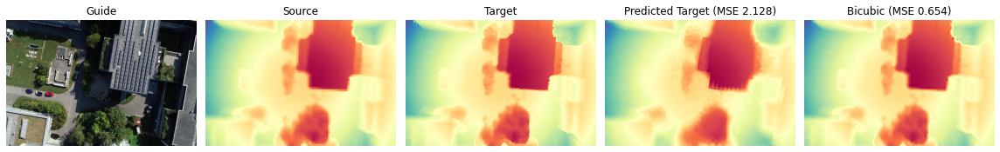

MSE: 2.128  ---  MAE: 0.809  ---  PBP: 0.241





In [13]:
guide_img = guide_imgs[0]
target_img = target_imgs[0]
source_img = downsample(target_img,params['scaling'])

bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params)

f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
plt.show()

if target_img is not None:
    # compute metrics and plot results
    MSE = np.mean((predicted_target_img - target_img) ** 2)
    MAE = np.mean(np.abs(predicted_target_img - target_img))
    PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

    print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
    print("\n\n")
 

### Change upsampling to 40

In [12]:
torch.cuda.empty_cache()

/tmp/ipykernel_374276/316343794.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axarr = plt.subplots(1, 2)


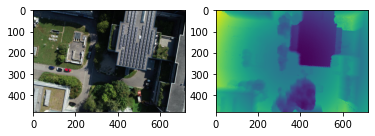

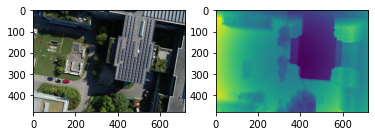

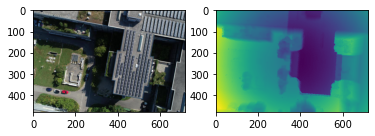

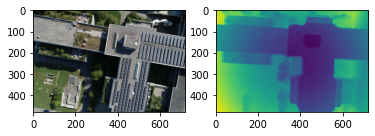

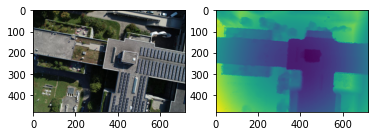

...

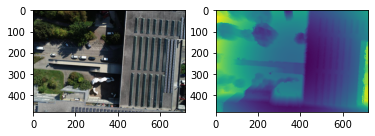

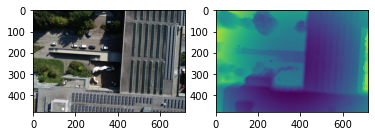

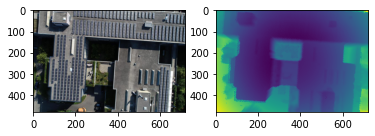

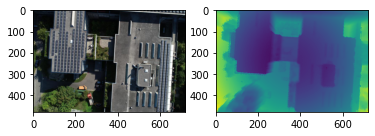

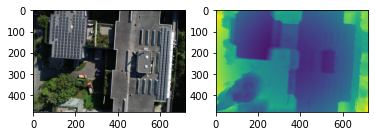

In [13]:
for i in range(25):
    f, axarr = plt.subplots(1, 2)
    guide_img = np.rollaxis(guide_imgs[i], 0, 3)
    axarr[0].imshow(guide_img)
    axarr[1].imshow(target_imgs[i])




####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[68.61361   18.020252  15.293021  12.984028  11.687708  10.705668
 10.373753   9.370062  10.071955   8.442344   7.8030295  7.372685
  7.1728444  6.965974   6.743339   7.092016 ]
----------MAE----------
(16,)
[6.451608  3.18312   2.7708268 2.4974172 2.383762  2.2744677 2.2214203
 2.0892434 2.2102084 1.9885733 1.9323412 1.865071  1.8488704 1.7995027
 1.753927  1.8204235]


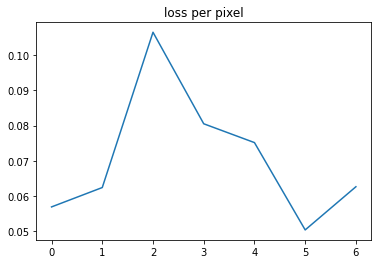

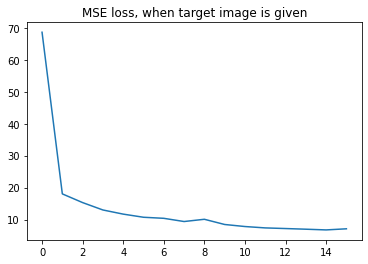

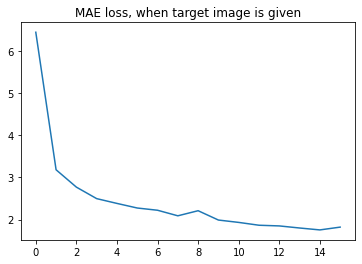

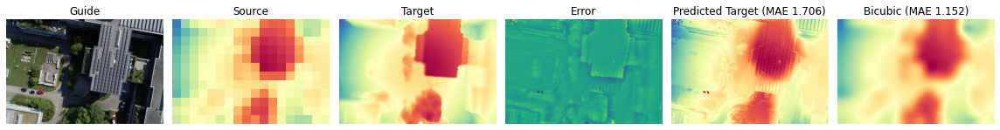

MSE: 6.385  ---  MAE: 1.706  ---  PBP: 0.530



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [10]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 40,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*12*18//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

#### train and plot the results ################################################
if len(params['img_idxs'])==0:
    idxs = np.array(range(0,target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 10
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = guide_imgs[idx]
    target_img = target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_EPFL_nadir/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 


### Change upsampling to 90， here first try crop the image to 450x720

In [13]:

torch.cuda.empty_cache()

In [14]:
## crop images
new_guide_imgs = guide_imgs[:,:,15:465,:]
new_target_imgs = target_imgs[:,15:465,:]
print(new_guide_imgs.shape)
print(new_target_imgs.shape)

(25, 3, 450, 720)
(25, 450, 720)


####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[81.71695  32.655083 23.767788 23.841276 22.73431  22.622995 22.947275
 23.093119 24.261642 23.576113 24.345516 24.389866 23.620207 24.1834
 23.669579 22.324232]
----------MAE----------
(16,)
[6.826477  4.1535497 3.5749724 3.6202672 3.5074265 3.5899677 3.571661
 3.6246018 3.6783187 3.6281314 3.7042022 3.7064252 3.6076274 3.5838327
 3.5605233 3.5520217]


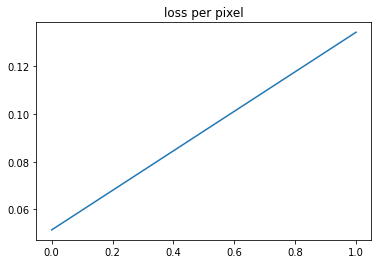

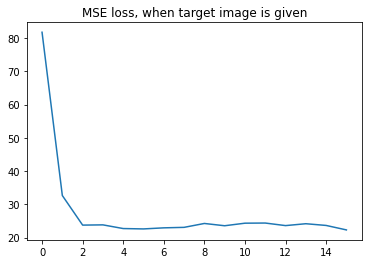

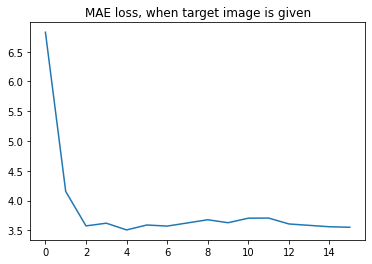

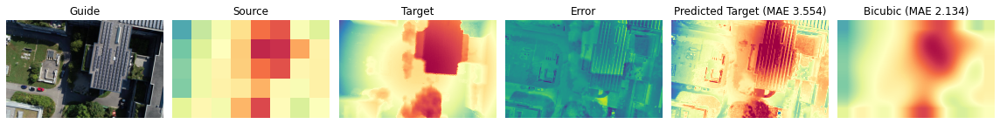

MSE: 23.008  ---  MAE: 3.554  ---  PBP: 0.781



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[77.26853  30.565144 28.248255 21.878273 24.398853 23.00375  23.959785
 23.556503 23.363941 22.978334 23.115    22.638563 22.48439  22.617395
 22.472767 21.682673]
----------MAE----------
(16,)
[6.613642  4.109714  4.2013764 3.4804962 3.6901505 3.5602267 3.5449843
 3.5473409 3.5155149 3.5201497 3.5372508 3.4486823 3.4946907 3.4875271
 3.4922655 3.4102077]


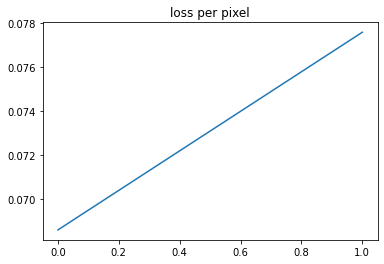

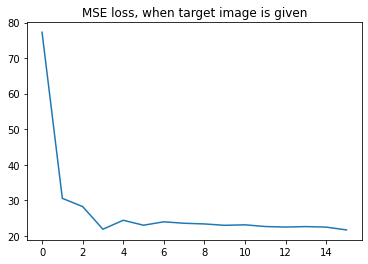

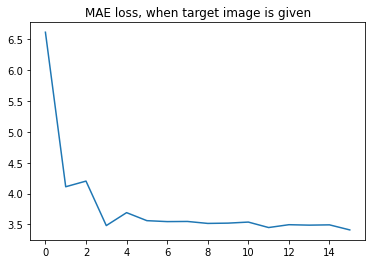

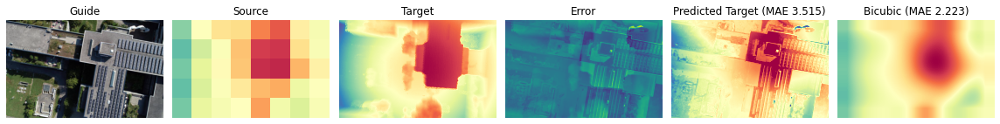

MSE: 22.036  ---  MAE: 3.515  ---  PBP: 0.795



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[77.876335 35.100693 38.42057  37.078552 39.504055 40.467224 43.655647
 41.590546 41.333843 39.20942  43.5872   41.50501  43.76181  43.2262
 39.696136 43.779503]
----------MAE----------
(16,)
[7.1886945 4.113676  3.9747324 3.9158242 3.9261382 3.900804  3.9982748
 4.145001  4.1758113 4.0167966 4.1758127 4.2083654 4.240145  4.22375
 4.020622  4.2422986]


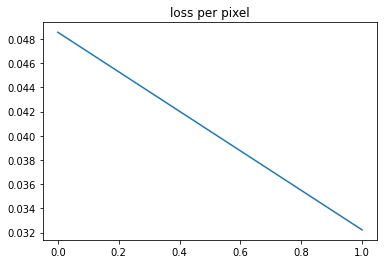

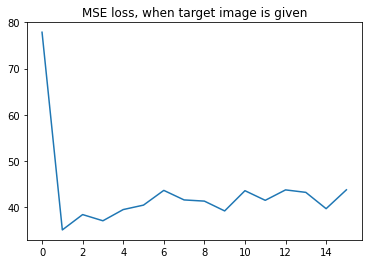

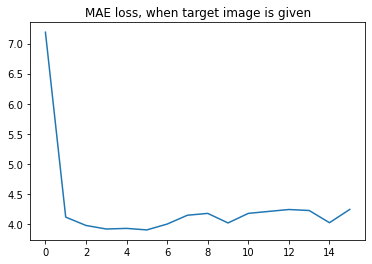

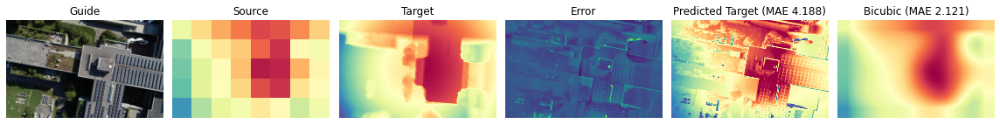

MSE: 43.002  ---  MAE: 4.188  ---  PBP: 0.813



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[88.92922  53.093822 39.936825 36.57649  34.48641  30.770964 31.787643
 30.896292 28.213156 29.662249 25.95106  26.652864 26.309612 25.962828
 25.508139 26.372639]
----------MAE----------
(16,)
[8.053228  5.8423634 4.965181  4.893429  4.7048073 4.376771  4.3723474
 4.4020905 4.1406903 4.155472  3.945796  3.9739022 3.975541  3.958524
 3.9373596 3.9310365]


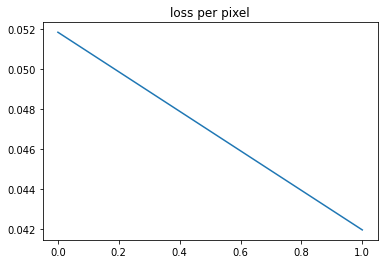

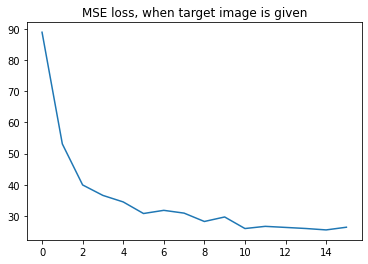

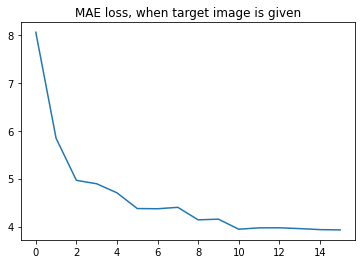

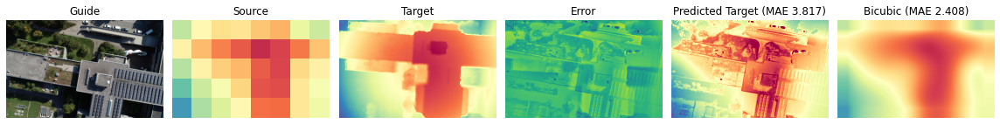

MSE: 24.458  ---  MAE: 3.817  ---  PBP: 0.829



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[100.52385   39.425213  29.952059  23.468613  19.416079  19.769192
  20.636955  18.878653  18.881943  20.466162  18.322298  17.459291
  19.177961  18.02333   18.14914   18.02939 ]
----------MAE----------
(16,)
[8.438084  5.186385  4.334811  3.5769982 3.3089106 3.334772  3.4432836
 3.2104716 3.2219696 3.3377693 3.1553307 3.09608   3.208466  3.125095
 3.142934  3.1243677]


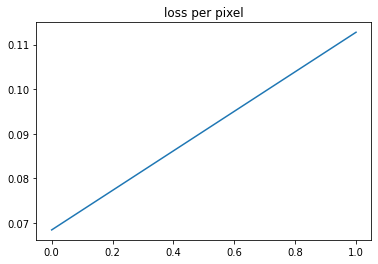

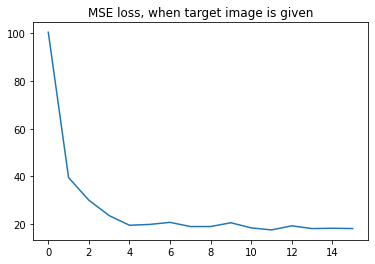

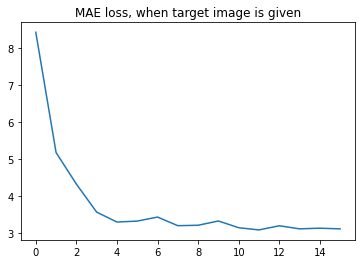

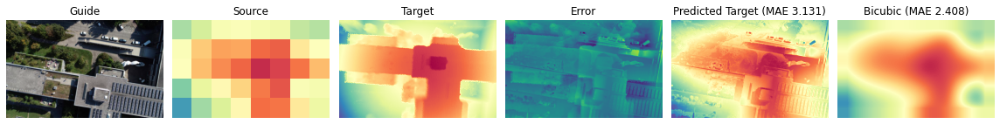

MSE: 18.188  ---  MAE: 3.131  ---  PBP: 0.764



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[81.37565  56.083954 28.861864 26.426266 25.146973 25.57081  22.924513
 21.940918 21.699177 21.77793  20.956253 20.761652 21.093935 21.37965
 21.090607 21.089546]
----------MAE----------
(16,)
[7.5740867 5.638881  4.086075  3.8078704 3.7559738 3.8107572 3.5180101
 3.4329855 3.3776996 3.4343214 3.3218331 3.3965833 3.3786366 3.432172
 3.3798435 3.362747 ]


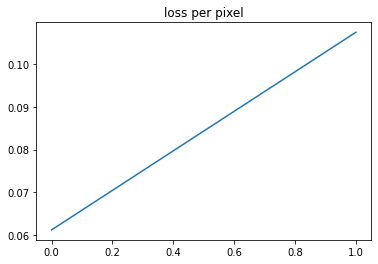

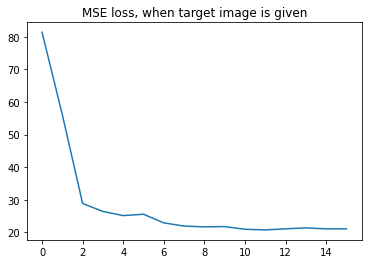

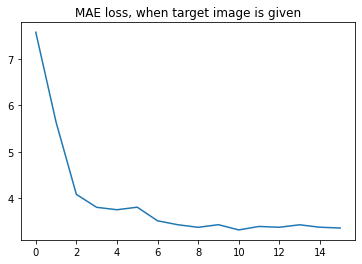

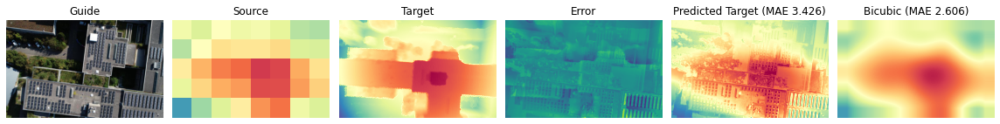

MSE: 21.650  ---  MAE: 3.426  ---  PBP: 0.783



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[80.58297  37.30663  37.554947 34.01884  30.179586 30.00572  31.756548
 29.25942  29.759779 30.58216  33.203575 34.627117 33.39337  34.141758
 31.332563 35.95109 ]
----------MAE----------
(16,)
[7.2810802 4.612052  4.550319  4.367517  4.089774  4.135757  4.3424478
 4.143213  4.126711  4.2516003 4.453182  4.668534  4.506679  4.44823
 4.3577094 4.7746644]


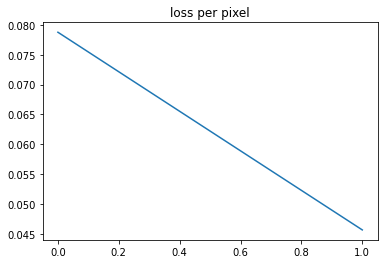

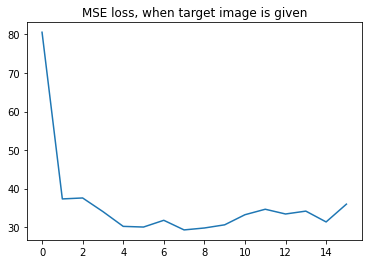

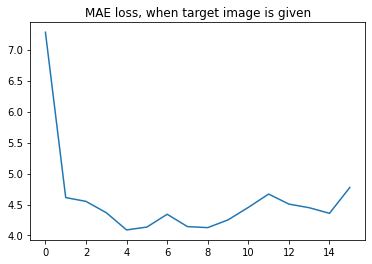

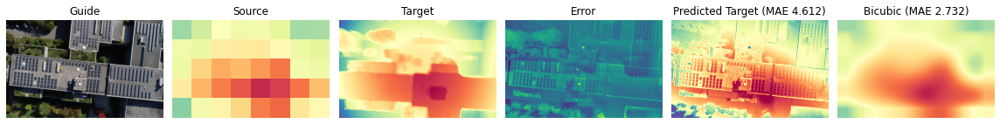

MSE: 34.547  ---  MAE: 4.612  ---  PBP: 0.869



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[38.38805  24.36463  21.2157   19.94716  20.983278 19.298615 21.291325
 20.96594  21.450111 21.922817 23.829622 22.413643 24.71427  27.728174
 27.505087 27.852905]
----------MAE----------
(16,)
[4.9451423 3.8335884 3.6170862 3.4965625 3.547355  3.4355226 3.5565302
 3.496088  3.5445664 3.5749075 3.7613528 3.6644523 3.8382392 4.0359297
 4.0215254 4.038371 ]


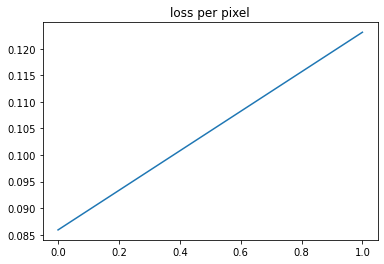

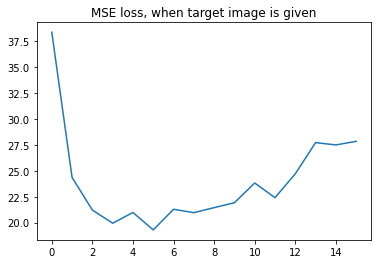

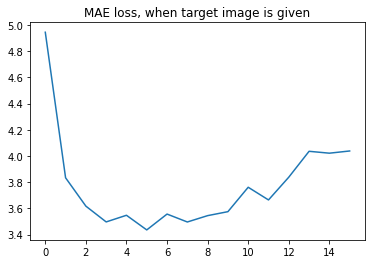

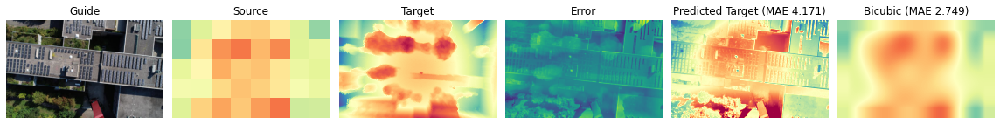

MSE: 29.980  ---  MAE: 4.171  ---  PBP: 0.818



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[78.50803  27.170599 24.498646 23.920732 24.592384 24.85735  28.295235
 23.905321 24.227383 27.729168 27.980303 24.679962 25.3122   28.192736
 25.107813 27.538942]
----------MAE----------
(16,)
[7.55088   4.0148416 3.8630402 3.748031  3.6871479 3.7152736 3.9737918
 3.6549149 3.6507897 3.8698967 3.953282  3.7169387 3.744662  3.9222555
 3.6976576 3.8101575]


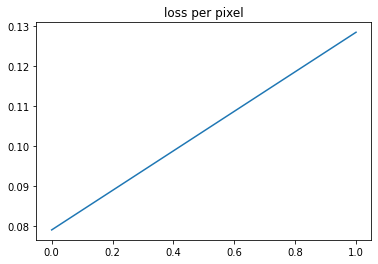

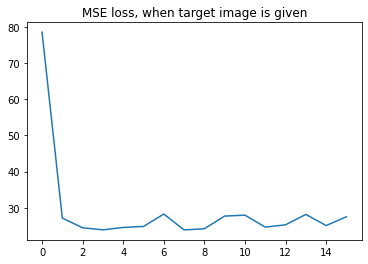

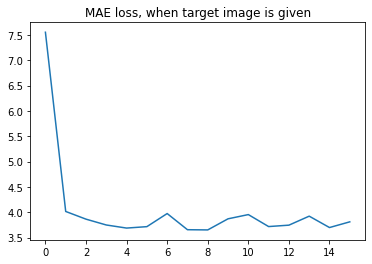

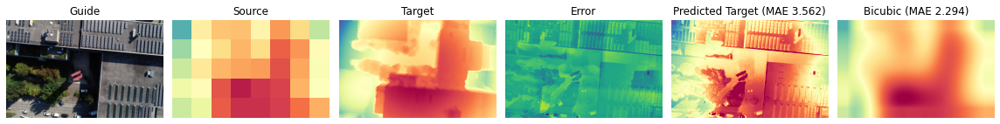

MSE: 23.380  ---  MAE: 3.562  ---  PBP: 0.789



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[69.638596 49.56696  21.332115 21.36416  25.577349 21.611742 21.760723
 22.159676 24.481276 25.716572 28.354479 26.289158 26.796137 28.75851
 27.43341  27.400496]
----------MAE----------
(16,)
[6.606551  5.651804  3.6141047 3.5631769 3.8823524 3.581355  3.5473497
 3.595096  3.7295425 3.8470612 3.9754329 3.8405602 3.8024635 3.9475746
 3.85519   3.8410342]


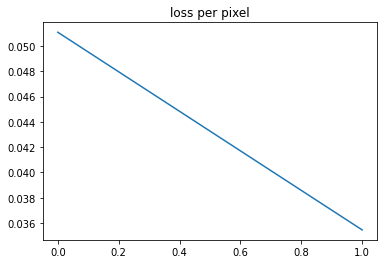

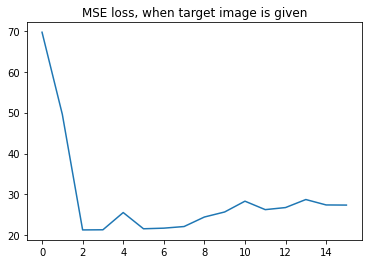

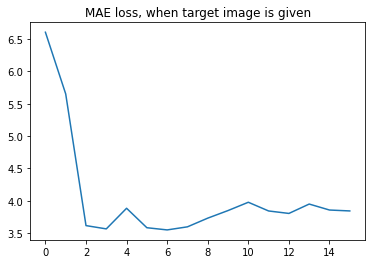

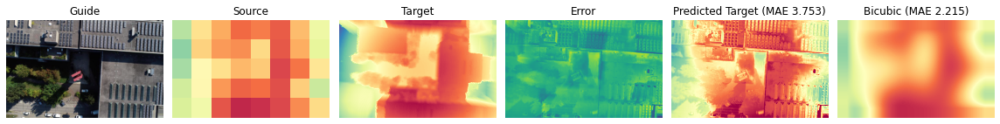

MSE: 26.402  ---  MAE: 3.753  ---  PBP: 0.787



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[68.498344 19.212076 21.832409 18.824442 21.33193  18.331106 18.488037
 19.17776  19.968636 19.393303 19.574287 20.710577 20.985495 20.197956
 20.879816 21.833828]
----------MAE----------
(16,)
[6.721673  3.3959122 3.613158  3.3220673 3.50246   3.3391845 3.27372
 3.3467207 3.4238632 3.3596475 3.3635988 3.4578974 3.4777706 3.43269
 3.4869287 3.542636 ]


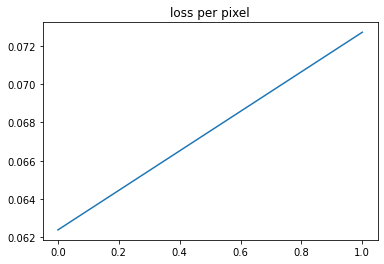

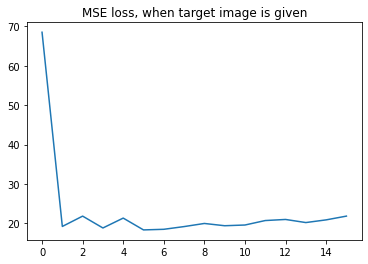

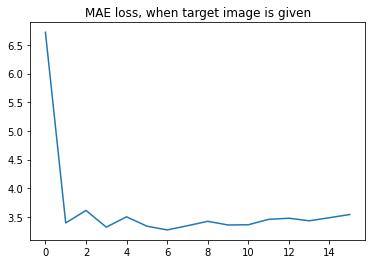

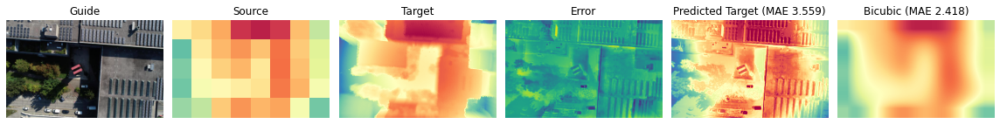

MSE: 22.366  ---  MAE: 3.559  ---  PBP: 0.795



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[63.75947  24.747082 22.083448 28.439661 20.189962 22.052855 22.571835
 27.305128 27.229624 25.210232 25.593248 29.660313 29.900013 29.297901
 29.885214 27.14438 ]
----------MAE----------
(16,)
[6.69486   3.9943223 3.791098  4.1611776 3.5077925 3.6494234 3.6282578
 3.983494  3.9379299 3.7239354 3.7530448 4.0309205 3.8107224 4.0531054
 3.8549118 3.7186925]


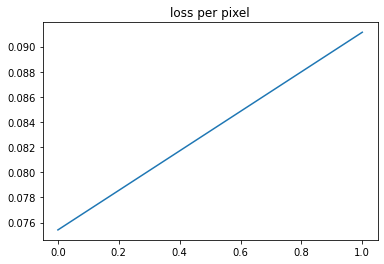

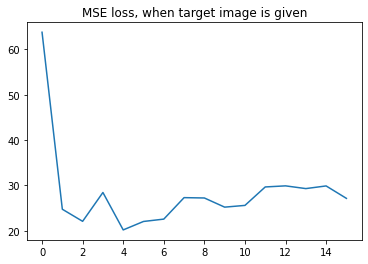

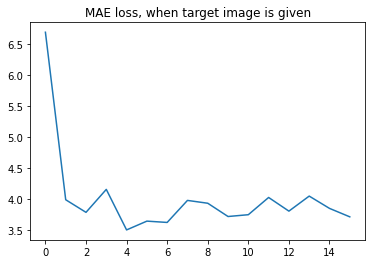

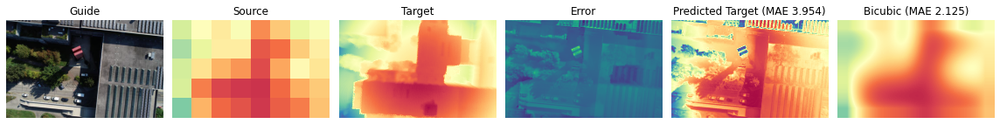

MSE: 31.686  ---  MAE: 3.954  ---  PBP: 0.791



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[78.26863  35.73008  27.316193 31.094397 25.041183 24.393728 23.863455
 22.759325 22.175285 24.248676 24.220745 24.209127 23.738005 24.038898
 24.814577 24.526093]
----------MAE----------
(16,)
[7.2942624 4.8011804 4.0459847 4.478785  3.9671953 3.9377694 3.8804593
 3.7196746 3.6964188 3.9648154 3.8617578 3.86801   3.7916822 3.836092
 3.8706636 3.8279026]


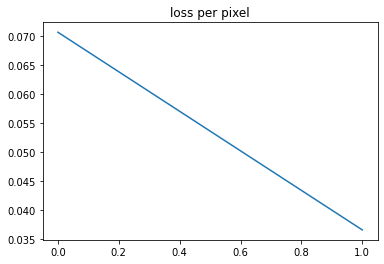

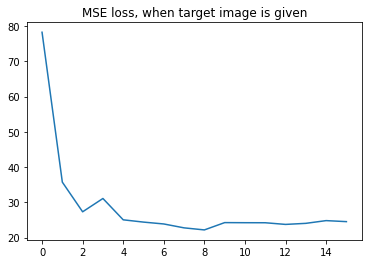

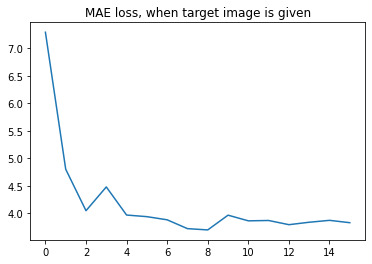

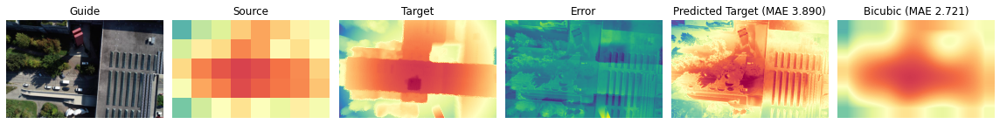

MSE: 25.024  ---  MAE: 3.890  ---  PBP: 0.826



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[76.88934  50.607277 44.071922 38.97692  38.174854 41.358543 37.12838
 37.044735 39.26118  40.235104 44.15137  40.027615 44.5349   43.89528
 45.695778 48.80931 ]
----------MAE----------
(16,)
[7.1773596 5.726488  5.018135  4.668948  4.65878   4.7719984 4.5731697
 4.572177  4.6480618 4.663961  4.8219123 4.6786    4.833234  4.7986407
 4.841011  5.0464706]


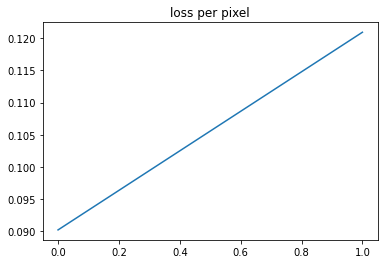

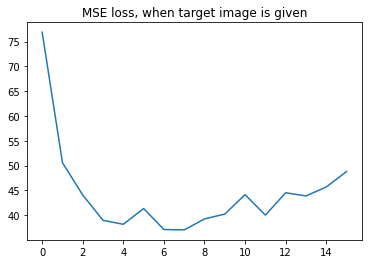

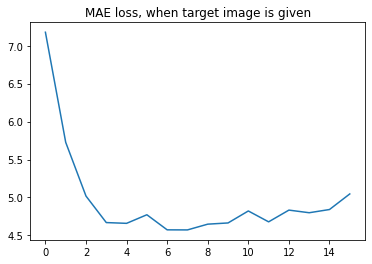

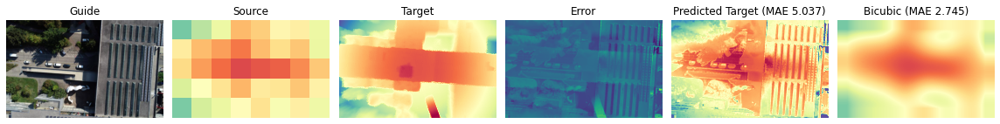

MSE: 49.442  ---  MAE: 5.037  ---  PBP: 0.839



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[60.35236  28.462847 23.39262  26.81143  27.384893 29.898859 30.986357
 33.82781  34.3781   35.976105 37.395977 40.43794  35.224403 39.19226
 41.551315 41.950615]
----------MAE----------
(16,)
[6.0663266 4.073228  3.5486698 3.846271  3.88823   4.059147  4.0898805
 4.3288465 4.306352  4.462453  4.52185   4.746748  4.372215  4.69438
 4.8657146 4.8790817]


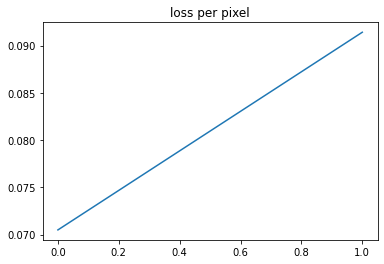

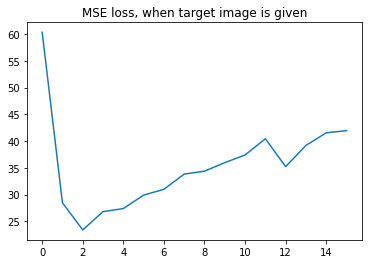

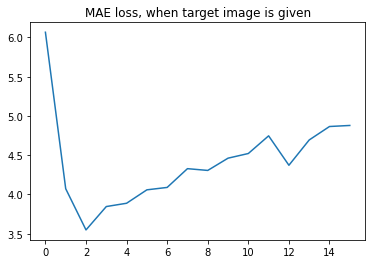

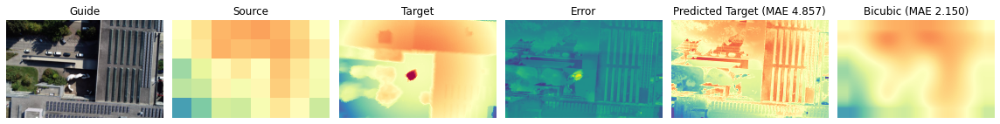

MSE: 42.217  ---  MAE: 4.857  ---  PBP: 0.861



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[53.627926 22.41864  26.16288  26.747877 28.253153 29.216473 25.63547
 28.345762 30.015411 30.933365 30.83565  29.085068 30.765682 31.290924
 29.2598   30.140093]
----------MAE----------
(16,)
[5.8828144 3.4807465 3.6647825 3.6128244 3.60108   3.688074  3.511628
 3.6776097 3.7364862 3.7716532 3.8779743 3.6392407 3.807886  3.7876375
 3.704531  3.8056192]


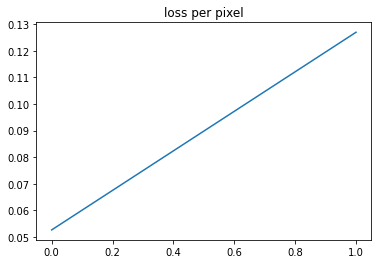

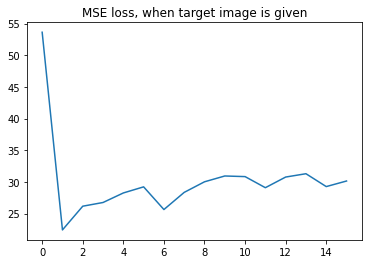

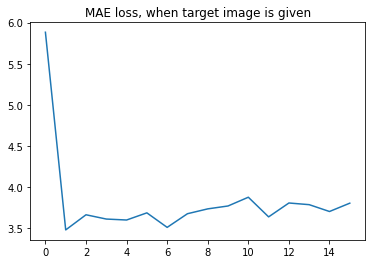

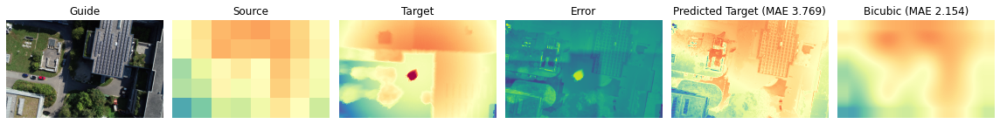

MSE: 29.983  ---  MAE: 3.769  ---  PBP: 0.776



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[60.477867  26.286137  17.518581  16.299374  15.29806   15.330334
 14.39522   14.239079  14.179056  14.4792385 13.836428  14.175844
 14.043896  13.929658  13.800846  13.811156 ]
----------MAE----------
(16,)
[6.1154275 3.8801432 3.1590993 2.8965025 2.762575  2.803584  2.6598084
 2.6353755 2.6075146 2.7127943 2.6217666 2.6554067 2.6404684 2.6662397
 2.6183527 2.6391397]


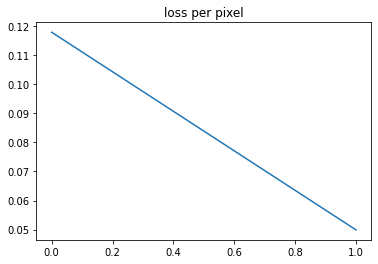

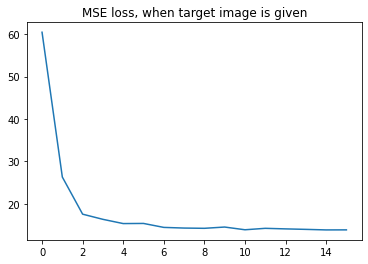

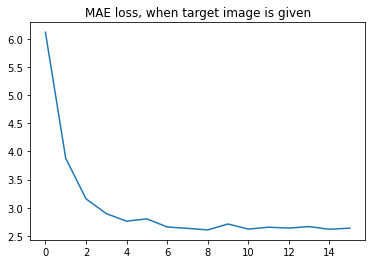

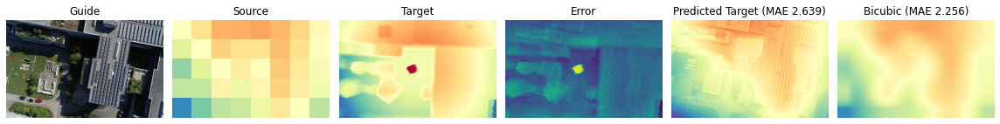

MSE: 13.717  ---  MAE: 2.639  ---  PBP: 0.710



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[53.314632 34.93467  31.413372 30.576063 29.6351   32.74099  33.117977
 32.95673  32.834415 32.84777  33.844074 33.65781  34.46225  34.863297
 36.34496  35.110268]
----------MAE----------
(16,)
[5.780245  4.389358  4.0531282 4.0654016 4.0179014 4.190312  4.1955886
 4.1798673 4.156835  4.17519   4.230733  4.2583838 4.304042  4.3129697
 4.3964887 4.352602 ]


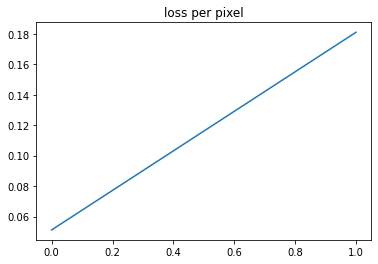

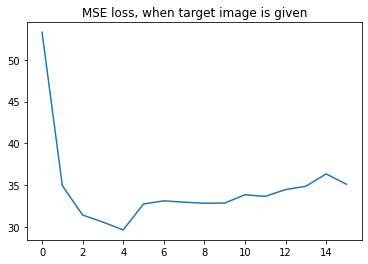

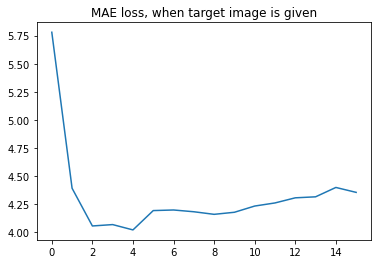

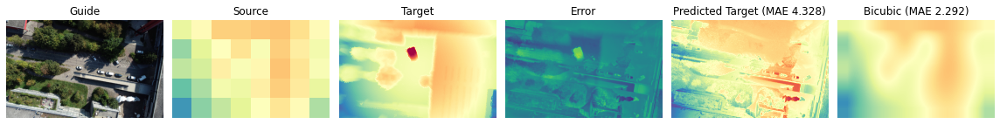

MSE: 35.278  ---  MAE: 4.328  ---  PBP: 0.779



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[51.815186 27.660532 25.269611 20.452602 20.608982 21.867495 21.85083
 20.852367 20.601625 21.328747 19.492788 20.053102 19.780964 21.187635
 19.65633  18.498238]
----------MAE----------
(16,)
[5.6091404 3.906112  3.6401772 3.3419476 3.335563  3.4111454 3.3733833
 3.329835  3.272014  3.292013  3.1287615 3.1744325 3.178557  3.264723
 3.1533716 3.0924056]


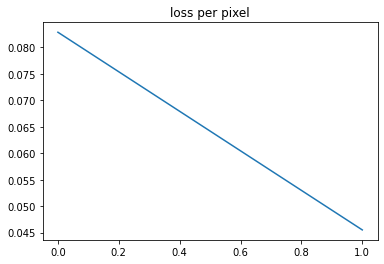

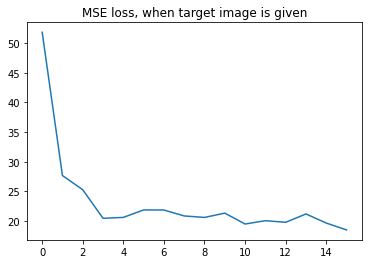

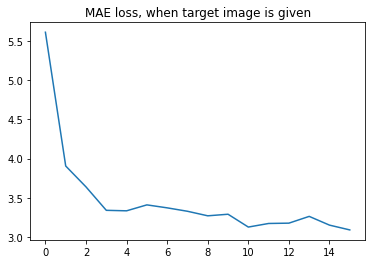

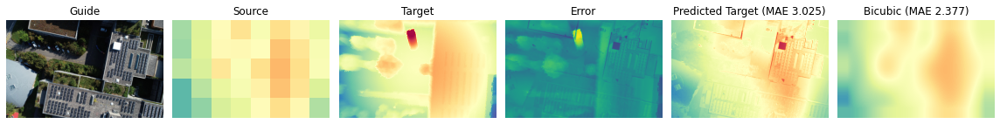

MSE: 18.203  ---  MAE: 3.025  ---  PBP: 0.767



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [16]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 90,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*5*8//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

if len(params['img_idxs'])==0:
    idxs = np.array(range(0,new_target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 50
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = new_guide_imgs[idx]
    target_img = new_target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_EPFL_nadir/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 